In [1]:
import sys
import time as clock

class ProgressBar:
    
    def __init__(self, total_iterations):
        
        self.total_iterations = total_iterations
        self.current_iteration = 0
        self.start_time = clock.time()
        
    def step(self):
        
        self.current_iteration += 1
        self.show_progress()
        if self.current_iteration == self.total_iterations:
            self.end_time = clock.time()
            print(f'\Total time taken: {self.end_time -self.start_time} seconds')
    
    def show_progress(self):
        
        percent_complete = self.current_iteration / self.total_iterations
        num_bars = int(percent_complete * 20)
        sys.stdout.write('\r')
        sys.stdout.write(f"Progress: [{'=' * num_bars}{' ' * (20 - num_bars)}]{int(percent_complete * 100)}%")
        sys.stdout.flush()
    
        

In [2]:
import numpy
import sympy
from sympy import init_printing
init_printing()

from matplotlib import pyplot
%matplotlib inline
from matplotlib import rcParams
rcParams['font.family'] = 'serif'
rcParams['font.size'] = 16

#animation
import matplotlib
from matplotlib import animation
from IPython.display import HTML

from sympy.utilities.lambdify import lambdify

In [3]:
class QuantumTunnellingSimulator:
    
    def __init__(self, time, Delta_x, Delta_t ):
       
        self.e_mass       = 1e-30                          # massa dell'elettrone
        self.vg           = 1e-1                           # velocità di gruppo (m/s)
        self.momentum     = self.vg * self.e_mass          # quantità di moto (kg * m/s) 
        self.plank_redux  = 1.054e-34                      # costante di Planck ridotta (J * s) 
        self.width0       = 2e-2                           # dispersione iniziale (m) 

        self.T            = time                           # tempo di simulazione (s)
        self.dx           = Delta_x                        # passo spaziale (m)
        self.dt           = Delta_t                        # passo temporale
        self.x_0          = 1e-1                           # posizione di partenza (m) 
        self.x_min        = 0                              # posizione iniziale (m)
        self.x_max        = 1                              # pozizione finale (m)
        self.nx           = int(self.x_max / self.dx) + 1  # numero di punti della griglia
        self.nt           = int(self.T / self.dt)          # passi temporali totali
        
        self.x_values     = numpy.linspace(self.x_min, self.x_max , self.nx) 
        
        self.K            = (self.momentum**2) / (2 * self.e_mass)  # energia cinetica delle particelle
        self.v0           = numpy.array([0 * self.K, -2 * self.K, -1 * self.K, -1/2 * self.K,
                                         1 * self.K, 1/2 * self.K, 2 * self.K])
        
        self.psi          = None
        self.real_psi     = None
        self.imag_psi     = None
        self.probab_distr = None 
      
    # FUNZIONI RICHIESTE DA: ASSIGNMENT_0: WRITE DOWN CODE
    
    # method to set the initial values of wavefunction
    def initialize_wavefunction(self, x, x0, sigma0, p0, h):
        
        wave_packet = sympy.exp(-((x-x0)**2 / (4 * sigma0**2))) / sympy.sqrt(sympy.sqrt(2 * sympy.pi) * sigma0) 
        exponential = sympy.exp((p0 * 1j * (x-x0)/ h))
        wave        = wave_packet * exponential
        wave_lamb   = lambdify((x0, x, p0, sigma0, h), wave)
        
        self.psi    = numpy.asarray([wave_lamb(self.x_0, x, self.momentum, self.width0, self.plank_redux) 
                                     for x in self.x_values])
        
    # method to evolving by one step the values of psi
    def evolve_one_step(self, dt, dx, v):
    
        un       = numpy.empty(self.nx)
        en       = numpy.empty(self.nx)
    
        self.real_psi = numpy.real(self.psi)
        self.imag_psi = numpy.imag(self.psi)
        
        #parte reale
        en = self.imag_psi.copy()
        self.real_psi[1:-1] +=  - (self.plank_redux / (2 * self.e_mass)) * dt / \
                               dx**2*(en[2:] - 2*en[1:-1] + en[0:-2]) \
                               + (dt / self.plank_redux) * v[1:-1] * en[1:-1]
        #At the boundary
        self.real_psi[0]    = 0
        self.real_psi[-1]   = 0
    
        #parte immaginaria
        un = self.real_psi.copy()   
        self.imag_psi[1:-1] +=  (self.plank_redux / (2 * self.e_mass)) * dt / \
                                dx**2*(un[2:] - 2*un[1:-1] + un[0:-2]) \
                                - (dt / self.plank_redux) * v[1:-1] * un[1:-1]
        #At the boundary    
        self.imag_psi[0]    = 0
        self.imag_psi[-1]   = 0  
    
    # method to calculate probability distribution
    def probability_distribution(self):
        self.psi = self.real_psi + 1j * self.imag_psi
        self.probab_distr = abs(self.psi)**2
        
    # method to plotting probability distribution, and the real and imaginary part of psi
    def plot_wavefunction(self):
        pyplot.plot(self.x_values, self.probab_distr, color='#003366', ls='-', lw=3)
        pyplot.plot(self.x_values, self.real_psi, color='#003366', ls='-', lw=3)
        pyplot.plot(self.x_values, self.imag_psi, color='#003366', ls='-', lw=3)
    
    # method to integrating probability distribution over dx       
    def integrate_probability_distribution(self):
        return numpy.sum(self.probab_distr) * (self.x_values[1] - self.x_values[0])
        
    
    #---------------------------------------------------------------------------metodi aggiuntivi
    
    # methode to initialize wavefunction with modified amplitude
    def initialize_wavefunction_amplitude(self, x, x0, sigma0, p0, h, t, M, amplitude):
        
        wave_packet = sympy.exp(-((x-x0)**2 / (4 * sigma0**2))) / sympy.sqrt(sympy.sqrt(2 * sympy.pi) * sigma0) 
        exponential = sympy.exp((p0 * 1j * (x-x0)/ h))
        wave        = amplitude * wave_packet * exponential
        wave_lamb   = lambdify((x0, x, p0, sigma0, h), wave)
        
        self.psi    = numpy.asarray([wave_lamb(self.x_0, x, self.momentum, self.width0, self.plank_redux) 
                                     for x in self.x_values])
    
    # method to initialize the exact probability of distribution
    def initialize_distribution_exact(self, x, x0, sigma0, p0, h, t, M):
        return sigma0 / sympy.sqrt(2 * sympy.pi) * sympy.exp(-(sigma0**2 * (x - ((p0 * t) / M))**2) / \
               (2 * ( sigma0**4 + (t**2 * h**2) / (4 * M**2) ))) / sympy.sqrt(sigma0**4 + (t**2 * h**2) / (4 * M**2) ) 
    
    # method to simulate the exact probability of distribution
    def simulate_distribuition_exact(self, distribution_exact, x, x0, sigma0, p0, h, dt, t , M, num_steps):
        distrib_ex_lamb = lambdify((x0, x, p0, sigma0, h, t , M), distribution_exact)
        return numpy.asarray([distrib_ex_lamb(self.x_0, x, self.momentum, self.width0, self.plank_redux,
                              num_steps * dt, self.e_mass) for x in self.x_values])
    
    # method to plotting probability of distribution
    def plot_distribuition_exact(self, distribution_exact):
        pyplot.plot(self.x_values, distribution_exact, color='r', ls='--', lw=2)
    
    def plot_psi(self):
        pyplot.plot(self.x_values, abs(self.psi)**2, color='#003366', ls='-', lw=2)
    
    # method to setting potential energy 
    def set_potential(self, num_potential):
        v = numpy.ones(self.nx) 
        v[numpy.intersect1d(numpy.where(self.x_values >= 5.0 * 10**-1), 
                            numpy.where(self.x_values <= 5.5 * 10**-1))] = self.v0[num_potential]
    
        v[numpy.where( self.x_values < 5.0 * 10**-1 )] = 0
        v[numpy.where( self.x_values > 5.5 * 10**-1 )] = 0
        
        return v  
    
    # method to plotting potential energy
    def plot_potential(self, potential):
        pyplot.plot(self.x_values, potential, color='#003366', ls='-', lw=2)
    
    # set time simulation
    def set_time(self, time):
        self.T = time
        
    # set number of steps 
    def set_num_steps(self, steps):
        self.nt = steps
        

In [4]:
time      = 0                     
Delta_x   = 1e-4                  
Delta_t   = 9e-5   
num_steps = int(time / Delta_t)
x, x0, sigma0, p0, h, t, M = sympy.symbols('x x0 sigma0 p0 h t M')

# costruiamo l'oggetto QuantumTunnellingSimulator
simulator = QuantumTunnellingSimulator(time, Delta_x, Delta_t)

In [5]:
# f) visualizzare il plotting della funzione d'onda per tutte le tipologie di barriera di potenziale

# impostiamo i valori iniziali
time      = 8
num_steps = int(time / Delta_t)
num_v0    = 1
simulator.set_time(time)
simulator.set_num_steps(num_steps)
potential = simulator.set_potential(num_v0)

In [6]:
amplitude = 2.1e-17
simulator.initialize_wavefunction_amplitude(x, x0, sigma0, p0, h, t, M, amplitude)

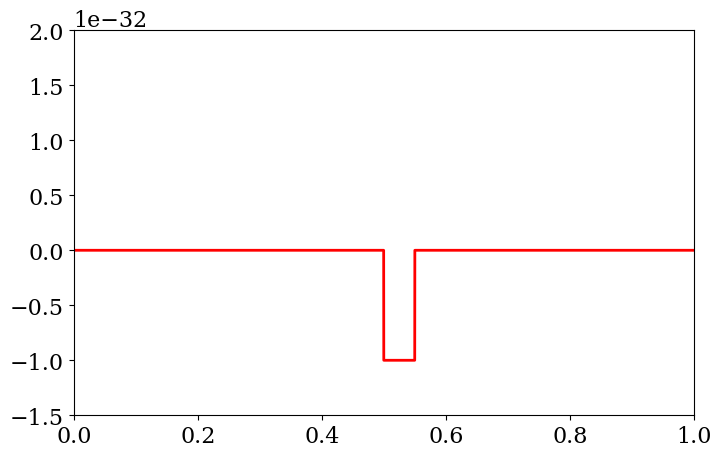

In [7]:
fig = pyplot.figure(figsize=(8,5))
simulator.plot_potential
ax = pyplot.axes(xlim=(0,1), ylim=(-1.5e-32,2e-32))
pyplot.plot(simulator.x_values, potential, color='r', ls='-', lw=2)
line  = ax.plot([], [], color='#003366', ls='-', lw=3)[0]

In [8]:
slice_steps = 1111
def wave(n):
    
    pb = ProgressBar(slice_steps)
    for n in range(slice_steps):
        simulator.evolve_one_step(Delta_t, Delta_x, potential)
        pb.step()
    
    p = simulator.real_psi + 1j * simulator.imag_psi
    line.set_data(simulator.x_values, abs(simulator.psi)**2)

In [9]:
anim = animation.FuncAnimation(fig, wave,
                               frames=80, interval=100)

In [10]:
HTML(anim.to_jshtml())

Progress: [====================]100%\Total time taken: 1.4492952823638916 seconds
Progress: [====================]100%\Total time taken: 1.4251399040222168 seconds
Progress: [====================]100%\Total time taken: 1.5169315338134766 seconds
Progress: [====================]100%\Total time taken: 1.7154648303985596 seconds
Progress: [====================]100%\Total time taken: 1.6712672710418701 seconds
Progress: [====================]100%\Total time taken: 1.6702911853790283 seconds
Progress: [====================]100%\Total time taken: 1.4994091987609863 seconds
Progress: [====================]100%\Total time taken: 1.5200417041778564 seconds
Progress: [====================]100%\Total time taken: 1.478132963180542 seconds
Progress: [====================]100%\Total time taken: 1.4789981842041016 seconds
Progress: [====================]100%\Total time taken: 1.481924057006836 seconds
Progress: [====================]100%\Total time taken: 1.4868464469909668 seconds
Progress: [=======

In [11]:
def wave_animation(time, frames, slice_steps, num_v0, amplitude):
    # impostiamo i valori iniziali
    time      = time
    Delta_t   = 9e-5  
    num_steps = int(time / Delta_t)
    num_v0    = num_v0
    simulator.set_time(time)
    simulator.set_num_steps(num_steps)
    potential = simulator.set_potential(num_v0)
    
    simulator.initialize_wavefunction_amplitude(x, x0, sigma0, p0, h, t, M, amplitude)
    
    fig = pyplot.figure(figsize=(8,5))
    simulator.plot_potential
    ax = pyplot.axes(xlim=(0,1), ylim=(-1.5e-32,2e-32))
    pyplot.plot(simulator.x_values, potential, color='r', ls='-', lw=2)
    line  = ax.plot([], [], color='#003366', ls='-', lw=3)[0]
    
    slice_steps = slice_steps
    def wave(n):
    
        pb = ProgressBar(slice_steps)
        for n in range(slice_steps):
            simulator.evolve_one_step(Delta_t, Delta_x, potential)
            pb.step()
    
        p = simulator.real_psi + 1j * simulator.imag_psi
        line.set_data(simulator.x_values, abs(simulator.psi)**2)
    
    return animation.FuncAnimation(fig, wave,
                                   frames=frames, interval=100)

Progress: [====================]100%\Total time taken: 1.5669200420379639 seconds
Progress: [====================]100%\Total time taken: 1.788816213607788 seconds
Progress: [====================]100%\Total time taken: 1.7389373779296875 seconds
Progress: [====================]100%\Total time taken: 1.6931202411651611 seconds
Progress: [====================]100%\Total time taken: 1.615398645401001 seconds
Progress: [====================]100%\Total time taken: 1.7081360816955566 seconds
Progress: [====================]100%\Total time taken: 1.6469264030456543 seconds
Progress: [====================]100%\Total time taken: 1.7011487483978271 seconds
Progress: [====================]100%\Total time taken: 1.5942401885986328 seconds
Progress: [====================]100%\Total time taken: 1.7201004028320312 seconds
Progress: [====================]100%\Total time taken: 1.6137893199920654 seconds
Progress: [====================]100%\Total time taken: 1.6407268047332764 seconds
Progress: [=======

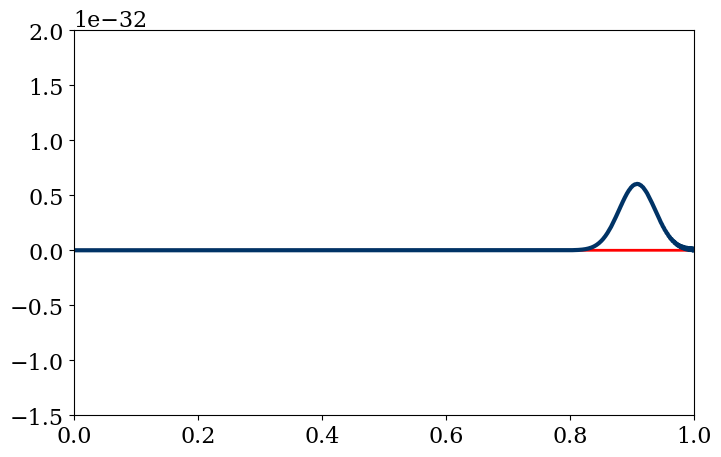

In [19]:
HTML(wave_animation(8, 80, 1111, 0, 2.1e-17).to_jshtml())

Progress: [====================]100%\Total time taken: 3.671334743499756 seconds
Progress: [====================]100%\Total time taken: 3.609375476837158 seconds
Progress: [====================]100%\Total time taken: 3.6271257400512695 seconds
Progress: [====================]100%\Total time taken: 3.3869175910949707 seconds
Progress: [====================]100%\Total time taken: 4.467121362686157 seconds
Progress: [====================]100%\Total time taken: 3.6477184295654297 seconds
Progress: [====================]100%\Total time taken: 3.380436897277832 seconds
Progress: [====================]100%\Total time taken: 3.2984085083007812 seconds
Progress: [====================]100%\Total time taken: 4.10640287399292 seconds
Progress: [====================]100%\Total time taken: 4.066496133804321 seconds
Progress: [====================]100%\Total time taken: 3.2332870960235596 seconds
Progress: [====================]100%\Total time taken: 3.029963731765747 seconds
Progress: [=============

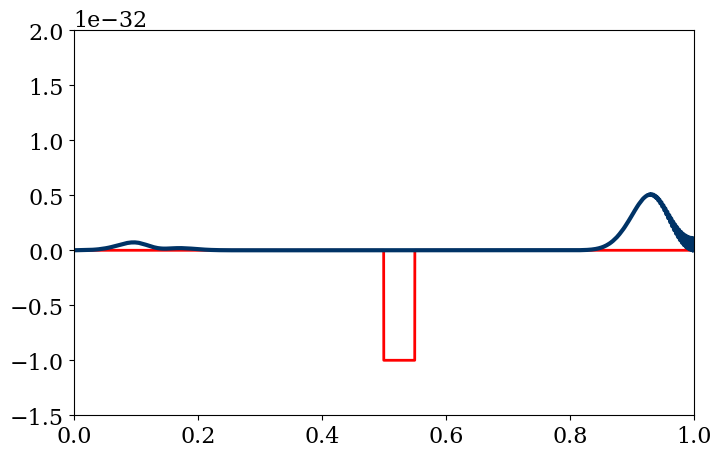

In [17]:
HTML(wave_animation(8, 80, 1111, 1, 2.1e-17).to_jshtml())

Progress: [====================]100%\Total time taken: 3.5612661838531494 seconds
Progress: [====================]100%\Total time taken: 3.855785846710205 seconds
Progress: [====================]100%\Total time taken: 3.4853360652923584 seconds
Progress: [====================]100%\Total time taken: 3.2220847606658936 seconds
Progress: [====================]100%\Total time taken: 3.5290262699127197 seconds
Progress: [====================]100%\Total time taken: 3.543822765350342 seconds
Progress: [====================]100%\Total time taken: 3.461418628692627 seconds
Progress: [====================]100%\Total time taken: 2.995187997817993 seconds
Progress: [====================]100%\Total time taken: 3.5786380767822266 seconds
Progress: [====================]100%\Total time taken: 3.4492757320404053 seconds
Progress: [====================]100%\Total time taken: 3.59208083152771 seconds
Progress: [====================]100%\Total time taken: 3.1643946170806885 seconds
Progress: [===========

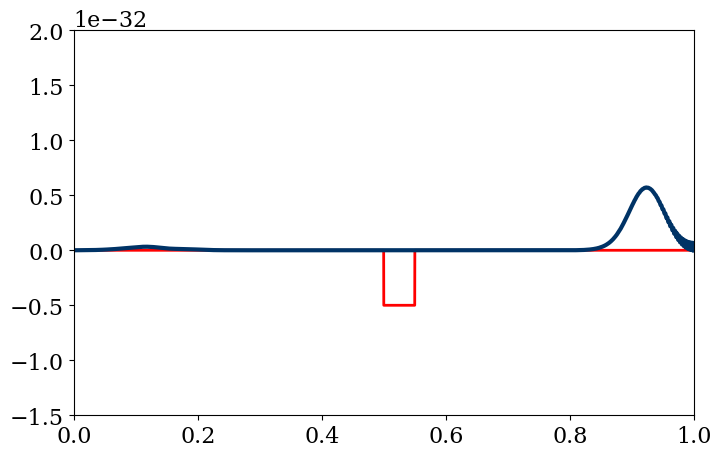

In [16]:
HTML(wave_animation(8, 80, 1111, 2, 2.1e-17).to_jshtml())

Progress: [====================]100%\Total time taken: 3.4868106842041016 seconds
Progress: [====================]100%\Total time taken: 4.626596450805664 seconds
Progress: [====================]100%\Total time taken: 3.498168468475342 seconds
Progress: [====================]100%\Total time taken: 3.056203842163086 seconds
Progress: [====================]100%\Total time taken: 3.482509136199951 seconds
Progress: [====================]100%\Total time taken: 3.6577417850494385 seconds
Progress: [====================]100%\Total time taken: 4.675743579864502 seconds
Progress: [====================]100%\Total time taken: 2.927685260772705 seconds
Progress: [====================]100%\Total time taken: 4.998967170715332 seconds
Progress: [====================]100%\Total time taken: 3.233750343322754 seconds
Progress: [====================]100%\Total time taken: 3.417168378829956 seconds
Progress: [====================]100%\Total time taken: 3.189744234085083 seconds
Progress: [===============

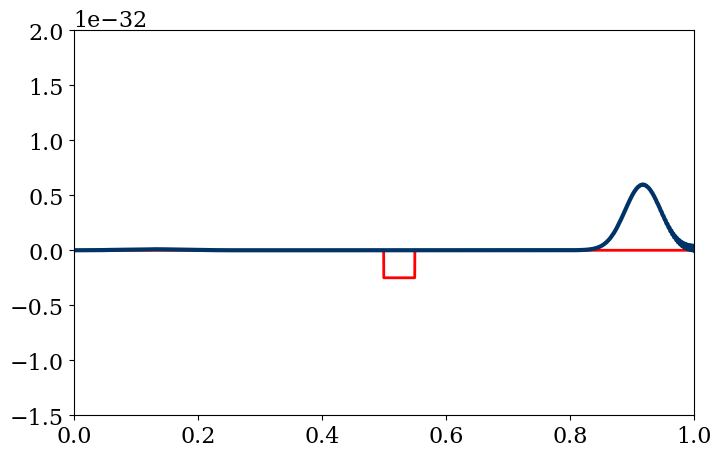

In [15]:
HTML(wave_animation(8, 80, 1111, 3, 2.1e-17).to_jshtml())

Progress: [====================]100%\Total time taken: 3.505878210067749 seconds
Progress: [====================]100%\Total time taken: 3.682687997817993 seconds
Progress: [====================]100%\Total time taken: 3.4892542362213135 seconds
Progress: [====================]100%\Total time taken: 3.2889907360076904 seconds
Progress: [====================]100%\Total time taken: 3.5727555751800537 seconds
Progress: [====================]100%\Total time taken: 3.6320083141326904 seconds
Progress: [====================]100%\Total time taken: 3.52776837348938 seconds
Progress: [====================]100%\Total time taken: 3.175333261489868 seconds
Progress: [====================]100%\Total time taken: 2.814917802810669 seconds
Progress: [====================]100%\Total time taken: 3.635607957839966 seconds
Progress: [====================]100%\Total time taken: 3.3185887336730957 seconds
Progress: [====================]100%\Total time taken: 3.530914068222046 seconds
Progress: [=============

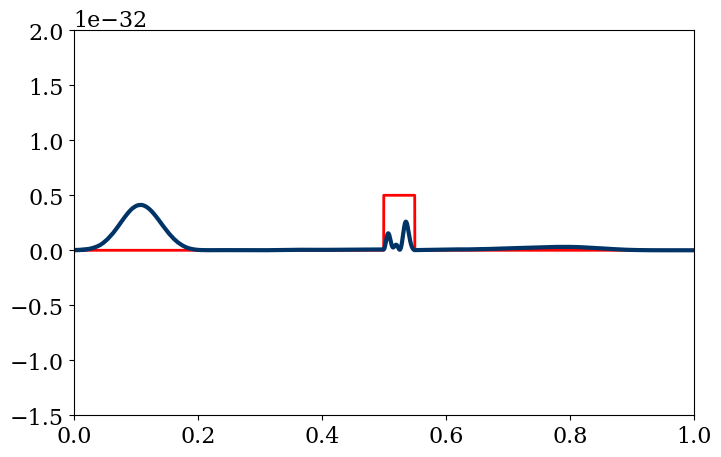

In [14]:
HTML(wave_animation(8, 80, 1111, 4, 2.1e-17).to_jshtml())

Progress: [====================]100%\Total time taken: 3.2651524543762207 seconds
Progress: [====================]100%\Total time taken: 3.1696529388427734 seconds
Progress: [====================]100%\Total time taken: 3.4207870960235596 seconds
Progress: [====================]100%\Total time taken: 3.542391777038574 seconds
Progress: [====================]100%\Total time taken: 4.033556699752808 seconds
Progress: [====================]100%\Total time taken: 3.2123818397521973 seconds
Progress: [====================]100%\Total time taken: 3.712127208709717 seconds
Progress: [====================]100%\Total time taken: 3.473810911178589 seconds
Progress: [====================]100%\Total time taken: 3.887279987335205 seconds
Progress: [====================]100%\Total time taken: 2.8833532333374023 seconds
Progress: [====================]100%\Total time taken: 3.305603504180908 seconds
Progress: [====================]100%\Total time taken: 3.3493313789367676 seconds
Progress: [===========

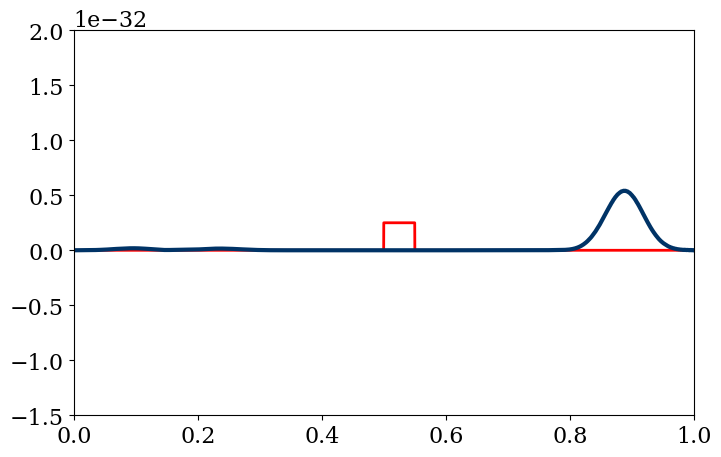

In [13]:
HTML(wave_animation(8, 80, 1111, 5, 2.1e-17).to_jshtml())

Progress: [====================]100%\Total time taken: 3.224942445755005 seconds
Progress: [====================]100%\Total time taken: 3.1068761348724365 seconds
Progress: [====================]100%\Total time taken: 3.484464168548584 seconds
Progress: [====================]100%\Total time taken: 3.841892719268799 seconds
Progress: [====================]100%\Total time taken: 3.3946242332458496 seconds
Progress: [====================]100%\Total time taken: 2.802443504333496 seconds
Progress: [====================]100%\Total time taken: 3.2792882919311523 seconds
Progress: [====================]100%\Total time taken: 3.116316318511963 seconds
Progress: [====================]100%\Total time taken: 3.1383414268493652 seconds
Progress: [====================]100%\Total time taken: 3.23331356048584 seconds
Progress: [====================]100%\Total time taken: 3.1130783557891846 seconds
Progress: [====================]100%\Total time taken: 3.3987419605255127 seconds
Progress: [============

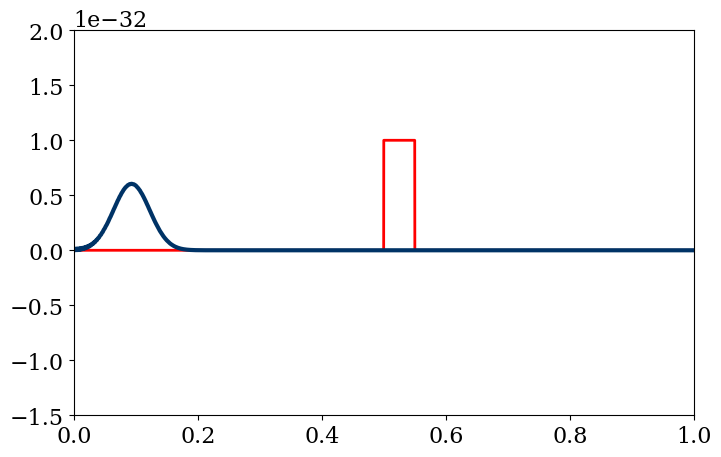

In [12]:
HTML(wave_animation(8, 80, 1111, 6, 2.1e-17).to_jshtml())